In [147]:
import tensorflow as tf
from tensorflow.keras import layers
import numpy as np
import matplotlib.pyplot as plt
import os
import pickle as pkl
from tqdm import tqdm

In [2]:
gpus = tf.config.experimental.list_physical_devices("GPU")
print(tf.__version__)
print(gpus)

2.1.0
[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:2', device_type='GPU')]


In [3]:
# set visible devices
tf.config.experimental.set_visible_devices(gpus[1], 'GPU')

In [4]:
def load_spin_data(fname):
    with open(fname, "rb") as fid:
        tmp_spins = pkl.load(fid)
        # (nitr, t, spin_x, spin_y)
        spins = tmp_spins[0]
        for i in range(1, 5):
            spins = np.concatenate((spins, tmp_spins[i]))
    return spins

In [52]:
# file names
fdir = '../data/'
fnames = os.listdir(fdir)

# Temperature: 1.5 - 3.5
T = 1.5
Tend = 3.5

NUM_T = int((Tend-T)/0.1+1)
Ts = np.linspace(T, Tend, NUM_T)
NUM_SPINS = 5000
LEN_SPIN = 100
BUFFER_SIZE = NUM_SPINS * NUM_T

# load data
spins = load_spin_data(os.path.join(fdir, "spins_%.2f.pkl"%(T)))
spin_labels = np.zeros([NUM_SPINS*NUM_T, NUM_T])
spin_temps = np.zeros([NUM_SPINS*NUM_T, 1])
spin_temps[:NUM_SPINS, 0] = T
spin_labels[:NUM_SPINS, 0] = 1
for i in tqdm(range(1, NUM_T)):
    T = np.round(T + 0.1, 1)
    tmp_spins = load_spin_data(os.path.join(fdir, "spins_%.2f.pkl"%(T)))
    spins = np.concatenate((spins, tmp_spins))
    spin_temps[(i*NUM_SPINS):((i+1)*NUM_SPINS), 0] = T
    spin_labels[(i*NUM_SPINS):((i+1)*NUM_SPINS), i] = 1

# convert data type
spins = spins.reshape(NUM_SPINS*NUM_T, LEN_SPIN, LEN_SPIN, 1)
spins = spins.astype('float32')
spin_temps = spin_temps.astype('float32')
spin_labels = spin_labels.astype('float32')

100%|██████████| 20/20 [02:04<00:00,  6.24s/it]


In [58]:
ids = [i for i in range(spins.shape[0])]
np.random.shuffle(ids)
# split dataset train: 7, test: 3
n = int(np.round(len(ids) * 7/10))
train_ids = ids[:n]
test_ids = ids[n:]
# train dataset
train_spins = spins[train_ids, :, :, :]
train_spin_temps = spin_temps[train_ids, :]
train_spin_labels = spin_labels[train_ids, :]
# test dataset
test_spins = spins[test_ids, :, :, :]
test_spin_temps = spin_temps[test_ids, :]
test_spin_labels = spin_labels[test_ids, :]

print(train_spins.shape, test_spins.shape)

(73500, 100, 100, 1) (31500, 100, 100, 1)


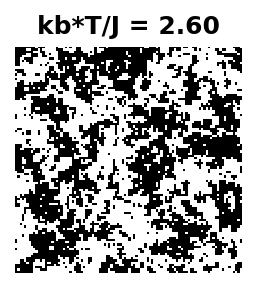

In [63]:
# show example data
n = 40000

plt.figure(dpi=150, figsize=(2, 2))
plt.imshow(train_spins[n][:, :, 0], cmap='gray')
plt.title("kb*T/J = %.2f"%(train_spin_temps[n, 0]), fontweight='bold')
plt.axis('off')
plt.show()

In [65]:
# shuffle & seperate data as batches
BATCH_SIZE = 256
train_set = tf.data.Dataset.from_tensor_slices((train_spins, train_spin_temps)).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
print(train_set)

<BatchDataset shapes: ((None, 100, 100, 1), (None, 1)), types: (tf.float32, tf.float32)>


### CNN model generate

In [271]:
model = tf.keras.Sequential()
model.add(layers.Conv2D(25, (50, 50), strides=2, padding='same',
                        input_shape=(100, 100, 1), activation='relu', name='conv2_layer1'))
# model.add(layers.BatchNormalization(name='batch_norm1'))
model.add(layers.Conv2D(50, (10, 10), strides=2, padding='same',
                        activation='relu', name='conv2_layer2'))
# model.add(layers.BatchNormalization(name='batch_norm2'))
model.add(layers.Conv2D(100, (5, 5), strides=5, padding='same',
                        activation='relu', name='conv2_layer3'))
# model.add(layers.BatchNormalization(name='batch_norm3'))
model.add(layers.Flatten(name='flat_layer'))
model.add(layers.Dense(1024, activation='relu', name='linear_layer1'))
model.add(layers.Dropout(0.2, name='dropout'))
model.add(layers.Dense(1, activation='relu', name='linear_layer2'))
# model.add(layers.Conv2D())

In [272]:
model.summary()

Model: "sequential_25"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2_layer1 (Conv2D)        (None, 50, 50, 25)        62525     
_________________________________________________________________
conv2_layer2 (Conv2D)        (None, 25, 25, 50)        125050    
_________________________________________________________________
conv2_layer3 (Conv2D)        (None, 5, 5, 100)         125100    
_________________________________________________________________
flat_layer (Flatten)         (None, 2500)              0         
_________________________________________________________________
linear_layer1 (Dense)        (None, 1024)              2561024   
_________________________________________________________________
dropout (Dropout)            (None, 1024)              0         
_________________________________________________________________
linear_layer2 (Dense)        (None, 1)               

In [273]:
model.compile(optimizer='adam', loss=tf.losses.MSE, metrics=['mse'])

In [274]:
EPOCHS = 20
hist = model.fit(train_set, epochs=EPOCHS)

Train for 288 steps
Epoch 1/20
288/288 [==============================] - 16s 55ms/step - loss: 3.9805 - mse: 3.9925
Epoch 2/20
288/288 [==============================] - 15s 52ms/step - loss: 0.0340 - mse: 0.0340
Epoch 3/20
288/288 [==============================] - 16s 57ms/step - loss: 0.0243 - mse: 0.0243
Epoch 4/20
288/288 [==============================] - 16s 57ms/step - loss: 0.0210 - mse: 0.0210
Epoch 5/20
288/288 [==============================] - 15s 53ms/step - loss: 0.0189 - mse: 0.0189
Epoch 6/20
288/288 [==============================] - 16s 57ms/step - loss: 0.0174 - mse: 0.0174
Epoch 7/20
288/288 [==============================] - 15s 52ms/step - loss: 0.0148 - mse: 0.0149
Epoch 8/20
288/288 [==============================] - 15s 52ms/step - loss: 0.0134 - mse: 0.0134
Epoch 9/20
288/288 [==============================] - 16s 57ms/step - loss: 0.0130 - mse: 0.0130
Epoch 10/20
288/288 [==============================] - 16s 57ms/step - loss: 0.0111 - mse: 0.0111
Epoch 11/

In [275]:
model.save('./conv2_ising_model')

INFO:tensorflow:Assets written to: ./conv2_ising_model/assets


dict_keys(['loss', 'mse'])


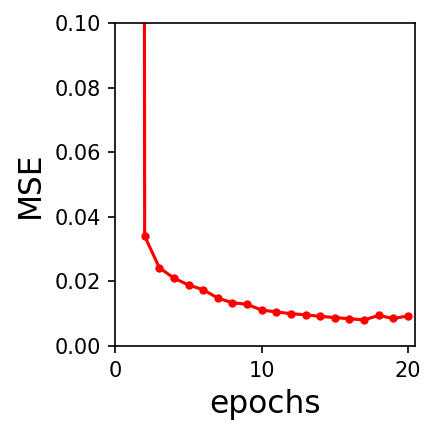

In [518]:
x_epochs = list(range(1, EPOCHS+1))
print(hist.history.keys())

plt.figure(dpi=150, figsize=(3, 3))
# plt.subplot(121)
plt.plot(x_epochs, hist.history['loss'], 'r.-')
plt.xlabel("epochs", fontsize=15)
plt.ylabel("MSE", fontsize=15)

plt.xlim([0, EPOCHS+0.5])
plt.ylim([0, 0.1])

plt.tight_layout()
plt.show()

In [278]:
test_mse = model.evaluate(test_spins, test_spin_temps, verbose=2)

31500/31500 - 4s - loss: 0.0081 - mse: 0.0081


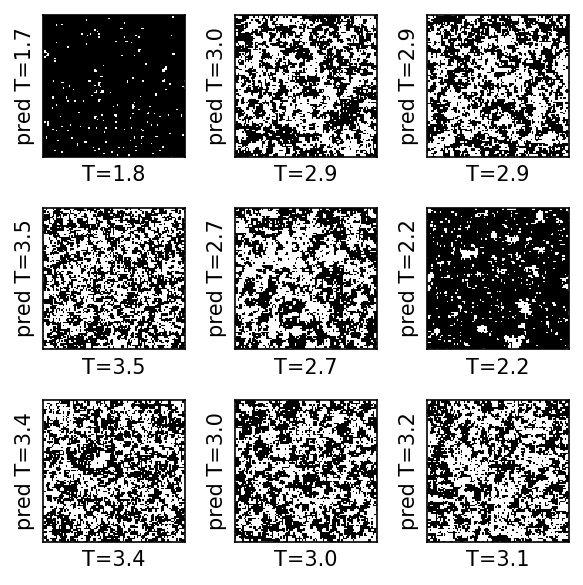

In [293]:
ids = np.random.choice(list(range(test_spins.shape[0])), 9)#list(range(9))
preds = model.predict(test_spins[ids], use_multiprocessing=False)

plt.figure(dpi=150, figsize=(4, 4))
for i in range(9):
    plt.subplot(3,3,i+1)
    
    plt.imshow(test_spins[ids[i], :, :, 0], cmap='gray')
    plt.xlabel('T=%.1f'%(test_spin_temps[ids[i]]))
    plt.ylabel('pred T=%.1f'%(np.round(preds[i], 1)))
    
    
#     plt.title('T=%.1f, pred T=%.1f'%(test_spin_temps[ids[i]], preds[i]))
    
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()
plt.show()

## layers' weights

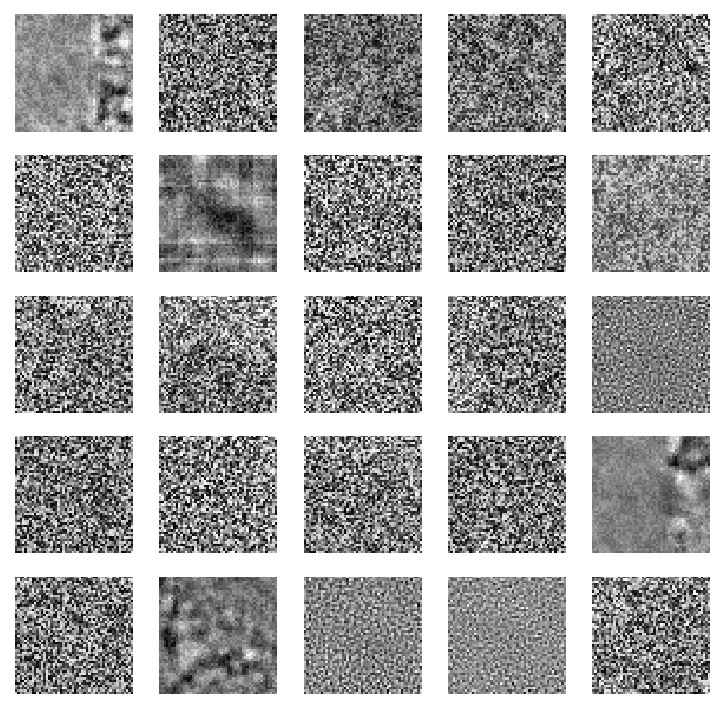

In [286]:
plt.figure(dpi=150, figsize=(6, 6))
for i in range(25):
    plt.subplot(5, 5, i+1)
#     arr = 
    
    plt.imshow(model.weights[0].numpy()[:, :, 0, i], cmap='gray')
    plt.axis('off')
plt.show()

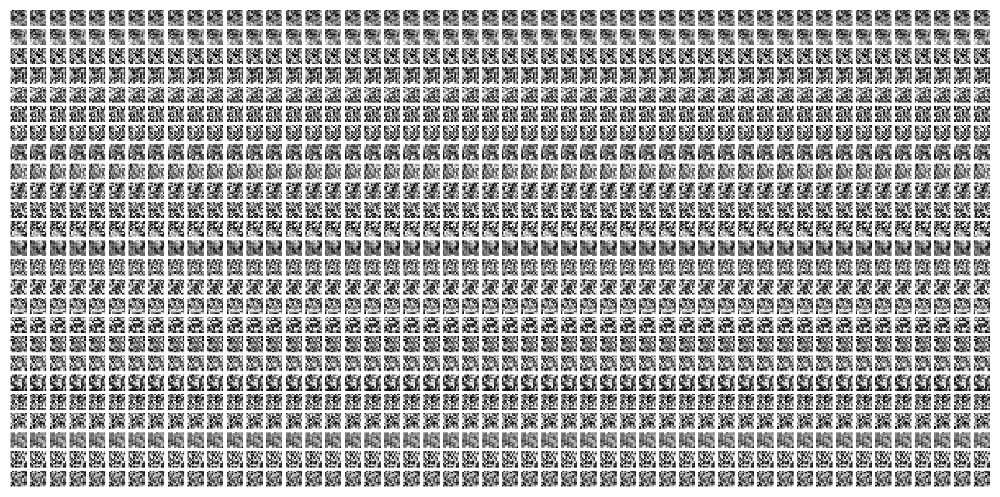

In [285]:
plt.figure(dpi=200, figsize=(12, 6))

for i in range(25):
    for j in range(50):
        plt.subplot(25, 50, i*50+j+1)
        plt.imshow(model.weights[2].numpy()[:, :, 0, i], cmap='gray')
        plt.axis('off')
plt.show()

## layer response

### conv2d layer

In [296]:
model_inter = tf.keras.Sequential()
model_inter.add(layers.Conv2D(25, (50, 50), strides=2, padding='same',
                              input_shape=(100, 100, 1), activation='relu', name='conv2_layer1'))

In [333]:
# put trained 1st convolution layer to model_inter
for i in range(len(model_inter.layers)):
    model_inter.layers[i].set_weights(model.layers[i].get_weights())

In [334]:
model_inter.summary()

Model: "sequential_27"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2_layer1 (Conv2D)        (None, 50, 50, 25)        62525     
Total params: 62,525
Trainable params: 62,525
Non-trainable params: 0
_________________________________________________________________


In [565]:
def pick_sample(n):
    targets = []
    outs = []
    for i in tqdm(range(NUM_T)):
        targets.append(spins[i*NUM_SPINS+n])
    targets = np.array(targets)    
    outs = model_inter.predict(targets)
    return targets, outs

def show_sample(n, fname):
    targets, outs = pick_sample(n)
    
    n1 = NUM_T
    n2 = 25 + 1
    
    fig = plt.figure(dpi=300, figsize=(30, 25))
    
    for m in range(n1*n2):
        i = m//n2
        j = m%n2
        
        plt.subplot(n1, n2, m+1)
        
        if j == 0:
            plt.imshow(targets[i, :, :, 0], cmap='autumn', vmin=-1, vmax=1)
            plt.ylabel('%.1f'%(1.5+i*0.1), fontsize=15)
            if i == 0:
                plt.title("input", fontsize=15)
        else:
            plt.imshow(outs[i, :, :, j-1], cmap='gray', vmin=0, vmax=2)
            if i == 0:
                plt.title("layer %d"%(j-1), fontsize=15)
        plt.xticks([])
        plt.yticks([])

    plt.tight_layout()
    plt.show()
    
    fig.savefig(fname)
    
    

In [568]:
id_sets = [200, 1800, 2900, 3500, 4900]

for n, i in enumerate(id_sets):
        show_sample(i, "Ising_CNN_response_%d.png"%(n))

100%|██████████| 21/21 [00:00<00:00, 134885.73it/s]


100%|██████████| 21/21 [00:00<00:00, 167772.16it/s]


100%|██████████| 21/21 [00:00<00:00, 195734.19it/s]


100%|██████████| 21/21 [00:00<00:00, 98304.00it/s]


100%|██████████| 21/21 [00:00<00:00, 161024.47it/s]


In [570]:
targets = []
for i in tqdm(range(NUM_T)):
    targets.append(spins[NUM_SPINS*i+4000])
targets = np.array(targets)

100%|██████████| 21/21 [00:00<00:00, 136136.61it/s]


In [581]:
pred = model(targets)

In [592]:
features_layer4 = tf.keras.models.Model(
    inputs=model.inputs,
    outputs=model.get_layer(name="linear_layer1").output,
)

In [593]:
features_layer4(targets).shape

TensorShape([21, 1024])

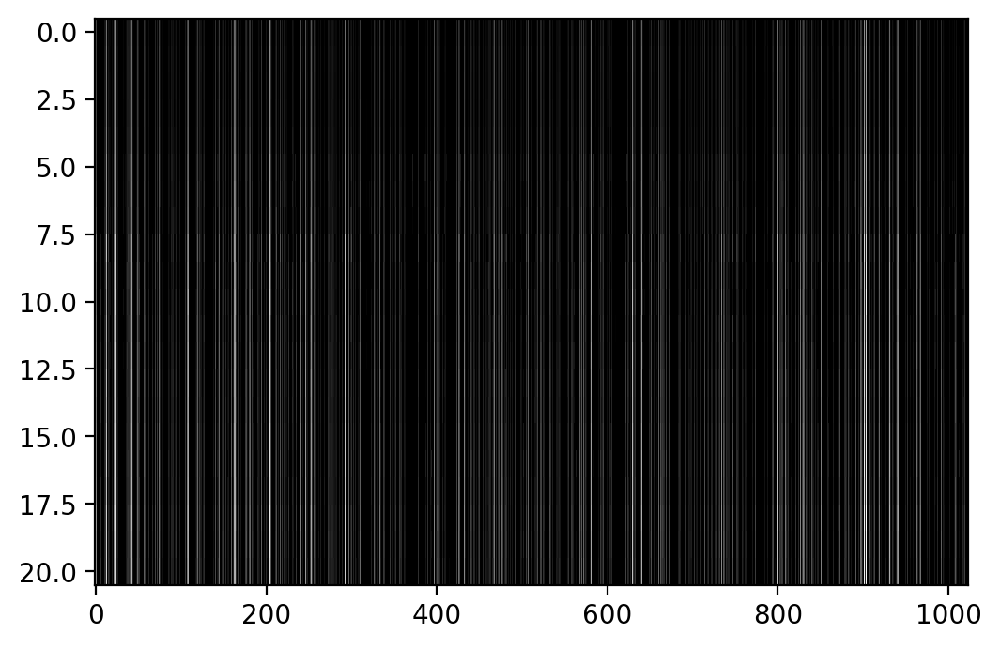

In [608]:
plt.figure(dpi=200, figsize=(6, 4))
plt.imshow(y, aspect='auto', cmap='gray')

plt.show()